# 🐶 End-to-End MultiClass Dog Breed Classification
This notebook builds an end to end multiclass image classifier using TensorFlow 2.0 and Tensorflow Hub.

## 1. Problem
Identifing the breed of the dog given the image of a dog. There are 120 dogs.
## 2. Data
Data is from Kaggle.\
https://www.kaggle.com/competitions/dog-breed-identification/data
## 3. Evaluations
Submissions are evaluated on Multi Class Log Loss between the predicted probability and the observed target.
Submission File

For each image in the test set, you must predict a probability for each of the different breeds. The file should contain a header and have the following format:
```
id,affenpinscher,afghan_hound,..,yorkshire_terrier
000621fb3cbb32d8935728e48679680e,0.0083,0.0,...,0.0083
etc.
```
## 4. Features
Information about the data:
- Unstructured data because they are images
- best if we use deep learning/transfer learning
- 120 different classes therefore multi-classification
- There are about 10,000 images in the training and 10,000 images in test set.

# ⭐<mark> Get WorkSpace Ready </mark>
- [X] Import data science packages
- [X] Import TF verion 2.x
- [X] Import TFHub
- [X] Make sure you use a GPU
- [X] Get Data


In [2]:
import pandas as pd
import tensorflow as tf

In [3]:
# Import TensorFlow into Collab
import tensorflow as tf
from tensorflow import keras
import tensorflow_hub as hub


# Check if there is a GPU available
print("GPU", "Yes" if tf.config.list_physical_devices("GPU") else "No")


GPU Yes


In [4]:
# Unzip the data
# !unzip "/content/drive/MyDrive/ML_DS/dog-vision/data/dog-breed-identification.zip" -d "/content/drive/MyDrive/ML_DS/dog-vision/data/"

# ⭐<mark> Preparing Data </mark>



## 🔆 Get Labels (y) and factors (X)
Labels are stored in labels.csv. These contain the dog breed associated to the various dog images.

We will use the images to predict the label (y). Using the image it self is difficult at the moment so we will use just the image path for now. We will make it numerical later on.

In [5]:
import pandas as pd
file_name = "/content/drive/MyDrive/ML_DS/dog-vision/data/labels.csv"
labels_csv = pd.read_csv(file_name)
labels_csv = labels_csv.sample(frac=1).reset_index(drop=True)
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     1831f3ce615ffe27a78c5baa362ac677  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  2772c0c2962911f330bb59457f91dbf8            kuvasz
1  b62f1c768b5eb401fdf27a4fc2b64cf5          papillon
2  1c32819dd77f0ae25c700670d4d054dc  mexican_hairless
3  221d6a5556c33cebd3d2f51eb6565dcf           samoyed
4  da37b8c9ea48f3db36bd638b290980ed          komondor


The 'id" is the file name of our images.

In [6]:
# Find the amount of images per class of dog
labels_csv.value_counts('breed').describe()

,count
count,120.000000
mean,85.183333
std,13.298122
min,66.000000
25%,75.000000
50%,82.000000
75%,91.250000
max,126.000000


The minimum number of images for a class is 13 per label.

In [7]:
# Lets see an image
from IPython.display import Image

                                    id        breed
6468  8009cbb471a6107109af3166c03b6e83  entlebucher


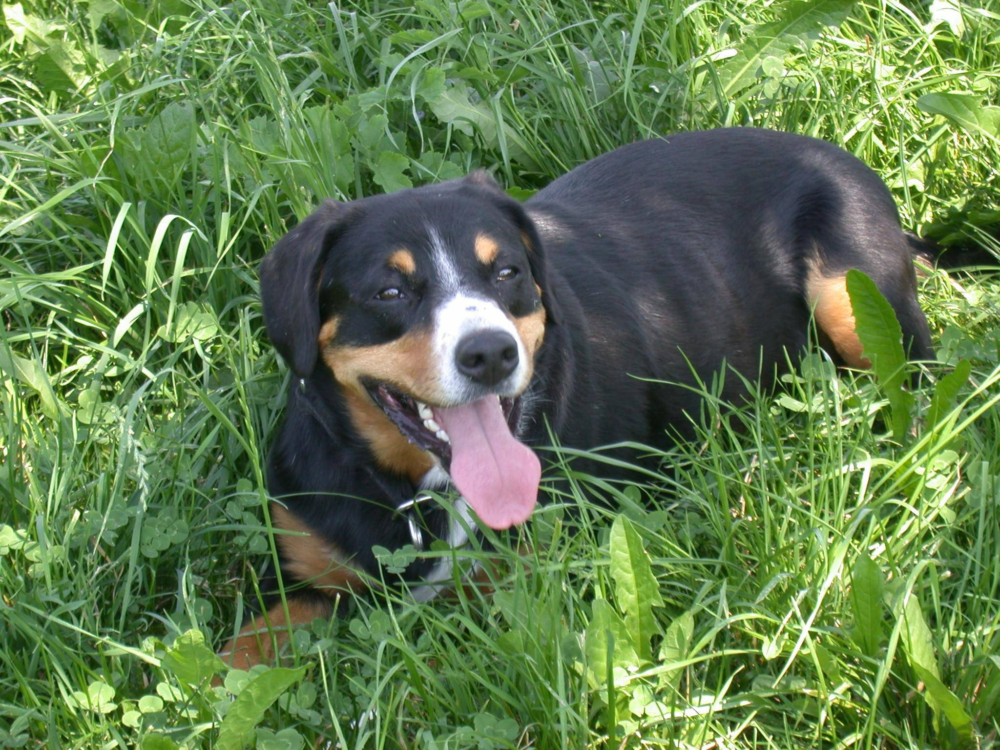

In [7]:
print(labels_csv[labels_csv['id']=="8009cbb471a6107109af3166c03b6e83"])
Image("drive/MyDrive/ML_DS/dog-vision/data/train/8009cbb471a6107109af3166c03b6e83.jpg")

In [31]:
# Make a list of the Image paths.
import os
filename = ["drive/MyDrive/ML_DS/dog-vision/data/train/" + fname + ".jpg" for fname in labels_csv['id'] ]

# Check if the NUMBER of filenames match the actual image files
if len(os.listdir("drive/MyDrive/ML_DS/dog-vision/data/train/")) == len (filename):
  print("MATCH, these are the same number of image files as files in the filename (py list)")
else:
  print("NO MATCH.")

# Check if the files exsist
file_error= []
for file in filename:
  if not os.path.isfile(file):
    file_error.append(file)
print("All the files exsists.") if len(file_error) == 0 else print(len(file_error))

# Check if number of labels = number of file names
import numpy as np
labels = labels_csv["breed"].to_numpy()
if len(labels) == len(filename):
  print("MATCH, there are equal number of labels (y) to file names (X)")
else:
  print("No Match")



MATCH, these are the same number of image files as files in the filename (py list)
All the files exsists.
MATCH, there are equal number of labels (y) to file names (X)


In [9]:
# Convert the labels into numbers
unique_breeds = np.unique(labels)

# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[7:9]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False,  True]),
 array([False, False, False, False, False, Fal

<mark>We have made </mark>
- ```filename``` - a list of files
- ```boolean_labels``` - a boolean array that contains 120 elements (number of breeds).

## 🔆 Create Validation Set
The dataset we recieved from kaggle doesnt come with a validation set we will create our own.

In [10]:
# Setup X and Y variables
X = filename
y = boolean_labels

print(len(X), len(y))

10222 10222


Will will experiement (make the basic model) with 1000 images and increase as needed as 10k images will take forever to process.

In [11]:
# Set number of images to use
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max: 10000, step:1000}

In [12]:
# Split the data into Validation and Test sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size = 0.2,
                                                 random_state = 42)
len(X_train),len(y_train),len( X_val), len(y_val )

(800, 800, 200, 200)

<mark>We have made </mark>
- ```X_train, y_train, ``` - Training set  
- ```X_val, y_val ``` - Validation set

## 🔆 Preprocessing Images (Make images into tensors)
We will make a function that will do the following:

1. take and image filepath as input
2. Use Tensor Flow to reas the file and save it to a variable
3. Turn the image into Tensors
4. Normalize the image (conver colour channel from 0-225 to 0-1)
5. Resize the images into a standarized size (224, 224)
6. Return the modified image



array([[[ 68,  12,   0],
        [ 28,   0,   0],
        [ 19,  22,  37],
        ...,
        [  0,  30,  48],
        [  0,  12,  34],
        [  0,   2,  25]],

       [[ 30,   0,   0],
        [ 24,   9,   6],
        [ 52,  75, 106],
        ...,
        [ 42,  90, 112],
        [  0,  42,  64],
        [  0,   5,  29]],

       [[ 21,  24,  39],
        [ 54,  77, 108],
        [111, 175, 236],
        ...,
        [105, 164, 194],
        [ 37,  82, 105],
        [  0,  16,  41]],

       ...,

       [[ 10,  20,   0],
        [ 46,  56,  22],
        [ 67,  77,  43],
        ...,
        [ 84,  90,  80],
        [ 42,  44,  41],
        [  6,   8,   5]],

       [[  0,   5,   0],
        [ 17,  25,   1],
        [ 25,  33,   9],
        ...,
        [ 52,  57,  50],
        [ 23,  25,  22],
        [  1,   3,   0]],

       [[  0,   5,   0],
        [  9,  17,   0],
        [  5,  13,   0],
        ...,
        [ 15,  20,  13],
        [  0,   2,   0],
        [  0,   1,   0]]], dtype=uint8)
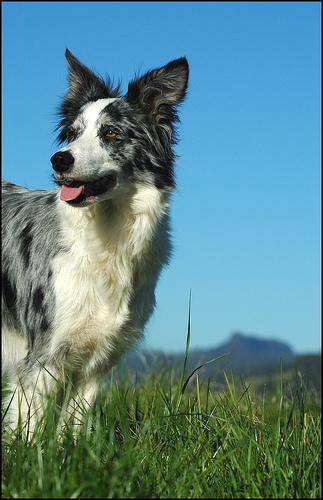

In [13]:
# Lets first see what an image looks like
# convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filename[851])
image.shape
image

In [13]:
# Define image size, you will need to know this when you decide the model you are using, as different models have specific inputs.
IMG_SIZE = (224, 224)

# Function for preprocessing imags
def  process_image(image_path, target_size=IMG_SIZE):
  """
  Turn an Image to a Tensor file.
  """

  # 1. read in an image file
  image = tf.io.read_file(image_path)
  # 2. Turn the jpeg into numerial tensor with 3 colour channels (red, green, blue)
  image = tf.image.decode_jpeg(image, channels = 3 )
  # 3. Convert the colour channel values from 0-225 to 0-1 values (Normalization)
  # 4. This makes computing more efficient
  image = tf.image.convert_image_dtype(image, tf.float32)
  # 5. Resize the image
  image = tf.image.resize(image, size=target_size) # Apply resizing here

  return image

<mark>We have made </mark>
- ```process_image``` - function that turns an image into a tensor file

## 🔆 Turning Data into Batches
For efficiency!

You work with 32 images at a time, because more will not fit into memory.

we need to put our data into Tensor tuples, eg:
` (image, label) `

we pass 32 tuples at a time.

In [14]:
# Function to make a Tuple of Tensors
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label (breed),
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [15]:
# example use of image and label #42
#tf.constant - Creates a constant tensor from a tensor-like object.
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5101182 , 0.6470939 , 0.32566482],
         [0.5305995 , 0.65906304, 0.34588164],
         [0.5180976 , 0.6296872 , 0.32713118],
         ...,
         [0.5580743 , 0.62683475, 0.40835676],
         [0.5493137 , 0.61141515, 0.40221998],
         [0.5387482 , 0.5961187 , 0.39365017]],
 
        [[0.49425632, 0.628131  , 0.30312815],
         [0.52760017, 0.6530203 , 0.3413606 ],
         [0.53001046, 0.64160013, 0.33904406],
         ...,
         [0.5649478 , 0.646905  , 0.4101334 ],
         [0.6016722 , 0.67453206, 0.4533222 ],
         [0.6417919 , 0.71339554, 0.49669388]],
 
        [[0.492807  , 0.62614036, 0.29672855],
         [0.53392863, 0.66127455, 0.34383756],
         [0.54515654, 0.65674615, 0.35419014],
         ...,
         [0.5400791 , 0.6379375 , 0.38434848],
         [0.5374579 , 0.6264703 , 0.38805312],
         [0.53171337, 0.6146767 , 0.38262844]],
 
        ...,
 
        [[0.5126821 , 0.5799813 

Now Turn all of our data into batches of tupls of tensors in the form `(image, labels)`. Remember there are 32 tuples in each batch.

In [16]:
# Define the batch size, 32 is the default
BATCH_SIZE = 32

# Create function that turns data into batches.
# Something different will happen to training, validation and testing data.
def create_data_batches(X,
                        y=None,
                        batch_size=BATCH_SIZE,
                        valid_data=False,
                        test_data=False):
  """
  Create bathces of data out of image (x) and label (y) pairs/tuples.
  It suffles the data if it is training data because there could be some order in the files that we did know about.
  Validation data is not shuffled.
  It also accespt test data as input, these have no labels.
  """

  ####################################################################
  # If the data is TEST dataset, we probably dont have labels.
  ####################################################################
  if test_data:
    # Turn filepath into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    # urns image into a tensor file
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  ####################################################################
  # If the data is VALIDATION dataset
  ####################################################################
  elif valid_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant (X), # filepath
                                               tf.constant(y))) # labels
    # create image label tuples & turns image into a tensor file
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

  ####################################################################
  # If the data is TRAIN dataset
  ####################################################################
  else:
    # Turn filepath and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices ((tf.constant(X),
                                                tf.constant(y)))
    # Shuffling pathnames and labels
    data = data.shuffle(buffer_size = len(X))
    # create image label tuples & turns image into a tensor file
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [17]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

In [18]:
# Lets take a look into our databatches (look at the attributes)
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [19]:
# Function to explore what is happening in the batch
import matplotlib.pyplot as plt

def show_25_images (images, label):
  """
  Display a plot of 25 images and their labels from the data batch.
  """
  plt.figure(figsize=(10,10))
  for i in range (25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    # unique_breeds[y[5].argmax()]
    # >> bedlington_terrier
    plt.title(unique_breeds[label[i].argmax()])
    plt.axis("off")

Our data is in data batches, so to be able to see the images we need to unbatch the batches to reveal the images.

<mark>We have made </mark>
- ```train_data``` — a tf.data.Dataset object
- ```.as_numpy_iterator()``` — Converts the TensorFlow dataset into a Python iterator that gives you NumPy arrays instead of Tensors.
- ```next(...)``` — Gets the next batch (the first one, if you haven’t iterated yet).


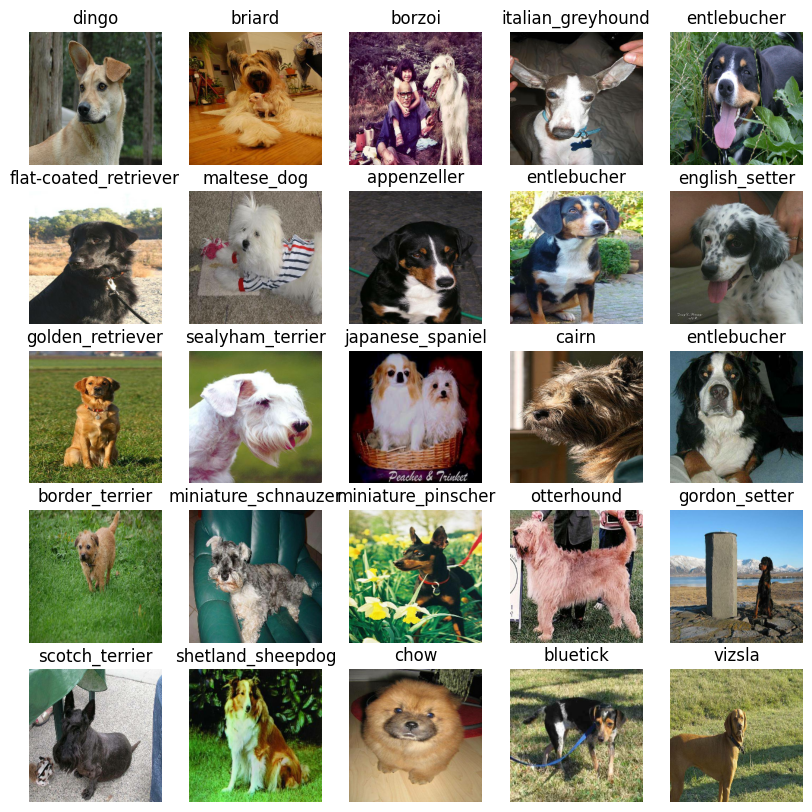

In [20]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

<mark>We have made </mark>
- ```get_image_label```- a function that makes a tuple of the image and the label, it is only used for validation and training dataset, not testing
- ```create_data_batches```- a function that creates data batches of 32 to ease processing within the system.
- ```train_data``` - tensor batches of training data
- ```val_data ``` - tensor batches of validation data
- ```show_25_images``` function that shows visual of 25 pictures.

# ⭐<mark> Building a Model </mark>

There are many ways to build a model
we will use the way that uses a pre-exsisting model.
We Need to Define some things:
*   The input shape (our image shape, in the form of tensors ) of our model
*   The output shape (image label in the form of tensors) of our model
*   The URL of the model we want to use (because we are using a pre-exsisting model)



## 🔆 Making an Model

In [22]:
# ---------------------------------------------------------
# 🧠 SETUP: Define the model input and output specifications
# ---------------------------------------------------------

# INPUT_SHAPE: shape of the images that will be fed into the model.
INPUT_SHAPE = (*IMG_SIZE, 3) # batch height width colour channels

# OUTPUT_SHAPE: number of possible classes to predict (i.e., number of dog breeds)
OUTPUT_SHAPE = len(unique_breeds)

# OUTPUT_SHAPE: number of possible classes to predict (i.e., number of dog breeds)
mobilenet_v2 ="https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

# MobileNetV2 models expect input images of shape (224, 224)
IMAGE_SHAPE = (224, 224)

In [23]:
# ---------------------------------------------------------
# 🧩 BASE MODEL: Load MobileNetV2 as a "feature extractor"
# ---------------------------------------------------------

# tf.keras.applications.mobilenet_v2.MobileNetV2()
# - Loads the MobileNetV2 architecture.
# - 'input_shape' defines the expected image size and channels.
# - 'include_top=False' removes the final classification layer (we’ll add our own).
# - 'weights=None' means we’re not loading pretrained ImageNet weights here.
backbone = tf.keras.applications.mobilenet_v2.MobileNetV2(
    input_shape=INPUT_SHAPE,
    include_top=False,
    weights="imagenet"
    )


# Add a Dense (fully connected) output layer on top of the backbone.
# - units=OUTPUT_SHAPE → one neuron per class.
# - activation="softmax" → outputs a probability distribution over all classes.
x = tf.keras.layers.Dense(
    units=OUTPUT_SHAPE,
    activation="softmax")(backbone.output)

# Create a complete Keras Model object linking inputs to outputs.
# This defines the full computational graph.
model = tf.keras.models.Model(inputs=backbone.input, outputs=x)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


we have the inputs output and model ready to go, lets put it in the Keras framework

Lets make the function that:


1.   Takes the input shame, output shape  and the model we have chosen.
2.   define the layes in the Keras model in a sequencial fashion
3.   Compiles the model.
4.   Build the model
5.   return the model



In [24]:
# ---------------------------------------------------------
# 🛠️ FUNCTION: Build a reusable model with pretrained weights
# ---------------------------------------------------------

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=None):
  """Builds and compiles a MobileNetV2-based image classification model."""
  print("Building model...")

  # Load the MobileNetV2 backbone with pretrained ImageNet weights.
  # Using 'imagenet' helps the model start with useful visual features (transfer learning).
  backbone = tf.keras.applications.mobilenet_v2.MobileNetV2(
      input_shape=input_shape,
      include_top=False,
      weights="imagenet")

  for layer in backbone.layers:
    layer.trainable = False

  # GlobalAveragePooling2D:
  # - Reduces each feature map to a single value by taking its average.
  # - Converts 4D output (batch, height, width, channels) to 2D (batch, channels).
  # - This reduces overfitting and keeps spatial info summarized.
  x = tf.keras.layers.GlobalAveragePooling2D()(backbone.output)

  # Final Dense layer:
  # - Softmax converts raw outputs (logits) into probabilities that sum to 1.
  x = tf.keras.layers.Dense(units=output_shape, activation="softmax")(x)

  # Combine backbone input and final output into one model.
  model = tf.keras.models.Model(inputs=backbone.input, outputs=x)

  # Compile the model to configure training behavior (tells model how to learn).
  # - loss: CategoricalCrossentropy → measures how wrong predictions are for multi-class problems.
  # - optimizer: Adam → adaptive learning rate optimizer that helps converge faster.
  # - metrics: ["accuracy"] → track accuracy while training.
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
      metrics=["accuracy"]
  )

  return model

In [25]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 2,377,592 (9.07 MB)

 Non-trainable params: 34,112 (133.25 KB)

| Function                                           | Purpose                                    | Notes                                                   |
| -------------------------------------------------- | ------------------------------------------ | ------------------------------------------------------- |
| `tf.keras.applications.mobilenet_v2.MobileNetV2()` | Loads a prebuilt CNN model                 | Great for transfer learning; can use pretrained weights |
| `GlobalAveragePooling2D()`                         | Summarizes feature maps into a flat vector | Reduces model size and overfitting                      |
| `Dense()`                                          | Fully connected layer                      | Used for classification                                 |
| `Model(inputs, outputs)`                           | Assembles the network                      | Creates a reusable model object                         |
| `compile()`                                        | Configures learning process                | Specifies loss, optimizer, and metrics                  |


^^^ Here we see the architecture of the model we just created.

<mark>We have made </mark>
- `create_model` - function that creates a model

## 🔆 Callbacks
callbacks are  helper functions a model can use during training to save progress. check progress, or stop training early if the model stops improving.

2 call backs
1. tensorboard to evaluate progress
2. early stopping prevents over training

In [26]:
# TENSOR BOARD CALLBACK
# Step 1 - load the extension
%load_ext tensorboard

In [27]:
import datetime
# Step 2 - Create tendor board call back to a directory and pass to the model's fit function
def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/ML_DS/dog-vision/data/versions",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  print(f"saving logs to {logdir}")
  return tf.keras.callbacks.TensorBoard(logdir)

# Early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  patience = 7)

<mark>We have made </mark>
- `create_tensorboard_callback` - funciton that creates a board to visualize model training.
- `early_stopping` - stops the training when the accuary has reached a specific condition.

# ⭐<mark>SubSet Model</mark>
- we will train on 1000 images only to make sure everything is working.

## 🔆Train Model

In [28]:
for x, y in train_data.take(1): print(x.shape, y.shape)
for x, y in val_data.take(1): print(x.shape, y.shape)

(32, 224, 224, 3) (32, 120)
(32, 224, 224, 3) (32, 120)


In [29]:
# Check if oyu are using a GPU
print("GPU", "AVAILABLE" if tf.config.list_physical_devices("GPU") else "not available")

GPU AVAILABLE


In [30]:
NUM_EPOCHS = 100

In [42]:
import os
import shutil
import datetime

# Create version folder with timestamp
version_name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
version_dir = f"/content/drive/MyDrive/ML_DS/dog-vision/data/versions"
os.makedirs(version_dir, exist_ok=True)

# Save a copy of the current notebook or script (if running from .py)
# ⚠️ If using Google Colab, replace 'my_notebook.ipynb' with your notebook name
try:
    shutil.copy("/content/drive/MyDrive/Colab Notebooks/dog-vision.ipynb", f"{version_dir}/my_notebook_{version_name}.ipynb")
except FileNotFoundError:
    print("⚠️ Could not find notebook file to copy — make sure the filename is correct.")

print(f"✅ Version folder created at {version_dir}")


import json

def save_metadata(history, version_dir):
    metrics = {
        "final_val_accuracy": history.history["val_accuracy"][-1],
        "final_train_accuracy": history.history["accuracy"][-1],
        "epochs_run": len(history.history["accuracy"]),
    }
    with open(os.path.join(version_dir, "metrics.json"), "w") as f:
        json.dump(metrics, f, indent=2)
    print("📊 Metrics saved!")


✅ Version folder created at /content/drive/MyDrive/ML_DS/dog-vision/data/versions


In [43]:
def train_model(train_data, NUM_EPOCHS = NUM_EPOCHS, ):
  model = create_model()

  # Making the logs will help us determine which model is better
  tensorboard = create_tensorboard_callback()

  # Fit model
  history = model.fit (x=train_data,
             epochs = NUM_EPOCHS,
             validation_data = val_data,
             validation_freq = 1,
             callbacks = [tensorboard, early_stopping])

  # Save model weights
  model_path = os.path.join(version_dir, "model_best.h5")
  model.save(model_path)
  print(f"✅ Model saved to {model_path}")
  save_metadata(history, version_dir)

  return model

In [44]:
model = train_model(train_data)

Building model...
saving logs to /content/drive/MyDrive/ML_DS/dog-vision/data/logs/20251106-032826
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 75s 570ms/step - accuracy: 0.0171 - loss: 4.9581 - val_accuracy: 0.0650 - val_loss: 4.4367
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 217ms/step - accuracy: 0.4159 - loss: 3.3885 - val_accuracy: 0.1650 - val_loss: 3.8810
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 220ms/step - accuracy: 0.7761 - loss: 2.1077 - val_accuracy: 0.2550 - val_loss: 3.3836
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 250ms/step - accuracy: 0.9344 - loss: 1.2349 - val_accuracy: 0.3100 - val_loss: 3.0480
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 187ms/step - accuracy: 0.9793 - loss: 0.6823 - val_accuracy: 0.3550 - val_loss: 2.8061
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 266ms/step - accuracy: 1.0000 - loss: 0.4421 - val_accuracy: 0.3600 - val_loss: 2.6762
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - accuracy: 1.0000 - loss: 0.2633 - val_accuracy: 0.3850 - val_loss: 2.

✅ Model saved to /content/drive/MyDrive/ML_DS/dog-vision/data/versions/model_best.h5
📊 Metrics saved!


## 🔆 Evaluate Model

In [45]:
# Checking tendorboad logs
%tensorboard --logdir /content/drive/MyDrive/ML_DS/dog-vision/data/versions

Reusing TensorBoard on port 6007 (pid 7439), started 0:15:21 ago. (Use '!kill 7439' to kill it.)

<IPython.core.display.Javascript object>

From the purple line of the trai dataset we see that the model is over fitting. you have the solution to these problems in your cue cards .



*  **What is over fitting:** When the network tries to learn too much or too many details in the training data along with the noise from the training data which results in poor performance on unseen or test dataset. When this happens the network fails to generalize the features/pattern found in the training data.
*  **How to spot it** : Overfitting during training can be spotted when the *error on training data decreases to a very small value* but the error on the new data or test data increases to a large value.
* **Why does this happen:**
   * One of the main reasons for the network to overfit is if the size of the training dataset is small.

* **How to fix it:**
   * **Decrease the network complexity**, removing certain layers or decreasing the number of neurons. **Do this by (1)** Grid search can be applied to find out the number of neurons and/or layers to reduce or remove overfitting. **(2)** The overfit model can be pruned (trimmed) by removing nodes or connections until it reaches suitable performance on test data.
   * **Data Augmentation**
   * **Weight Regularization**
   * **Dropouts**
   * **Early Stopping**



## 🔆 Making and Evaluating Predictiongs


In [ ]:
predictions = model.predict(val_data,verbose=1)
print(f"Prediction Shape: {predictions.shape}")
print(f"Actual Quanity (y-val): {len(y_val)}")
if predictions.shape[0] == len(y_val):
  print("Actual Label and Predictions are of the same lenght")
else:
  print("ERROR: Actual Label and Predictions are NOT of the same lenght")

# Turn prediction probailities into theri respective label (aka dog breed)
def get_pred_label(prediction_probabilities):
  """
  Turns and array of prediction probabilities of ONE imagea into a label (aka dog breed)
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

def unbatchify(data):
  # Unbatch Dataset
  images = []
  labels = []

  #Loop through unbathched data
  for image, label in data.unbatch().as_numpy_iterator():
    # the image variable is a PROCESSED image (tensor, normalized ,re sized)
    images.append(image)
    # This is a bianry list of 120 dog breeds. This is the TRUE Y
    labels.append(label)
  return images, labels


val_images, val_labels = unbatchify(val_data)

def plot_pred(prediction_probabilities, labels, images, n=16):
  """
  View the prediction, truth and the image.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  true_label = (unique_breeds[np.where(true_label == 1)[0][0]])
  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Red title worng, green title green
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  pass

def plot_pred_conf (prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  true_label = (unique_breeds[np.where(true_label == 1)[0][0]])
  # print(pred_prob, true_label)

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 confidence values from their indexes
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # Change color of true label
  if true_label in top_10_pred_labels:
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



i_multiplier= 3
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols,2*i+1)
  plot_pred(prediction_probabilities= predictions,
            labels = val_labels,
            images = val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels = val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad = 1.0)

plt.show()


In [46]:
print(predictions[0])
print(len(predictions[0]))

[0.00806747 0.00273645 0.0018112  0.00116555 0.00747718 0.00190371
 0.00898248 0.0032331  0.00160055 0.00058177 0.00153344 0.00288881
 0.00105354 0.00191956 0.00041373 0.0010986  0.00924143 0.00044285
 0.00304421 0.02151691 0.00939582 0.00210744 0.01498487 0.00941143
 0.00271879 0.00176674 0.00390694 0.00440542 0.00051348 0.00426915
 0.00052151 0.0028931  0.01164394 0.00105438 0.05781327 0.00430728
 0.00096087 0.00312417 0.00741546 0.00094933 0.01236581 0.00595913
 0.00029881 0.00094285 0.01306349 0.00767957 0.00304079 0.00468319
 0.07555473 0.00033635 0.01350557 0.00258885 0.00946237 0.01601765
 0.00676544 0.00203608 0.00192456 0.00142138 0.00765834 0.02832018
 0.00454162 0.00289459 0.00280631 0.00062755 0.08943301 0.00159107
 0.00075684 0.00138087 0.02716227 0.00109374 0.00226445 0.00225985
 0.00175616 0.00197049 0.00586091 0.00250261 0.00309974 0.01378258
 0.0089523  0.0012852  0.00511807 0.00164051 0.00065998 0.00104548
 0.00878904 0.00525263 0.00113224 0.00352348 0.01424821 0.0041

The **above print out** is the probability of one of the 283 images. An image could be 1 out of 283 breeds, the above is the probability it is a specific breed. The highest value == the breed that is the most likely.

In [47]:
# First Prediction
index = 0
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

Max value (probability of prediction): 0.13753148913383484
Sum: 1.0
Max index: 96
Predicted label: scotch_terrier


the closer to one the prediction probability (**aka confidence intervals**) is the more confident the prediction. in this case its 0.94, so the model is pretty sure it is a .

Now we want to do it at scale and we want to see the image that is being predicted.

##🔆 Saving and loading a model

In [25]:
# create fucntion to save model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str) to the filename.
  """
  # create model directory with the current time
  modeldir = os.path.join("/content/drive/MyDrive/ML_DS/dog-vision/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path




In [26]:
def load_model(model_path):
  # Load the model with custom objects for TensorFlow Hub layer
  model = tf.keras.models.load_model(model_path, custom_objects={'KerasLayer': hub.KerasLayer})
  return model

In [54]:
# save model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv3-Adam")

Saving model to: /content/drive/MyDrive/ML_DS/dog-vision/models/20251106-03511762401094-1000-images-mobilenetv3-Adam.h5...


'/content/drive/MyDrive/ML_DS/dog-vision/models/20251106-03511762401094-1000-images-mobilenetv3-Adam.h5'

In [55]:
loaded_model=load_model("/content/drive/MyDrive/ML_DS/dog-vision/models/20251106-03511762401094-1000-images-mobilenetv3-Adam.h5")

In [56]:
loaded_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 722ms/step - accuracy: 0.5030 - loss: 1.9966


[2.0202465057373047, 0.5]

# ⭐<mark>Full Model</mark>


## 🔆 Preparing Data

In [21]:
len(filename), len(boolean_labels)

(10222, 10222)

In [22]:
fulldata = create_data_batches(X = filename, y = boolean_labels)

In [60]:
fulldata

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## 🔆 Make & Train Model

In [61]:
fullmodel = create_model()

Building model...


In [62]:
full_model_tensorboard=create_tensorboard_callback()

full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)

saving logs to /content/drive/MyDrive/ML_DS/dog-vision/data/logs/20251106-040019


In [63]:
#Fitting the model to Full Data
fullmodel.fit(x=fulldata,
              epochs=NUM_EPOCHS,
              callbacks=[full_model_tensorboard,full_model_early_stopping])


Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 4059s 13s/step - accuracy: 0.2781 - loss: 3.4343
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - accuracy: 0.8050 - loss: 0.7960
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 145ms/step - accuracy: 0.8976 - loss: 0.4311
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - accuracy: 0.9600 - loss: 0.2330
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - accuracy: 0.9843 - loss: 0.1333
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - accuracy: 0.9925 - loss: 0.0821
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - accuracy: 0.9946 - loss: 0.0580
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - accuracy: 0.9957 - loss: 0.0466
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 147ms/step - accuracy: 0.9981 - loss: 0.0316
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - accuracy: 0.9987 - loss: 0.0231
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - accuracy: 0.9960 - loss: 0.0318
Epoch 12

## 🔆 Save & Load Model

In [64]:
save_model(fullmodel,suffix="full-image-set-trained-mobilenet_v2-Adam")

Saving model to: /content/drive/MyDrive/ML_DS/dog-vision/models/20251106-05201762406422-full-image-set-trained-mobilenet_v2-Adam.h5...


'/content/drive/MyDrive/ML_DS/dog-vision/models/20251106-05201762406422-full-image-set-trained-mobilenet_v2-Adam.h5'

In [27]:
loaded_model=load_model("/content/drive/MyDrive/ML_DS/dog-vision/models/20251106-05201762406422-full-image-set-trained-mobilenet_v2-Adam.h5")

## 🔆 Evaluate Model againt Validation set

In [23]:

vali_data=create_data_batches(X_val,y_val,valid_data=True)


In [29]:
loaded_model.evaluate(vali_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 55s 5s/step - accuracy: 0.9981 - loss: 0.0358


[0.03575475513935089, 0.9950000047683716]

# ⭐ <mark>Full Model Predictions</mark>

## 🔆Prepare Test Data

In [34]:
def get_file_paths_os(directory):
    file_paths = []
    for root, _, files in os.walk(directory):
        for file in files:
            file_paths.append(os.path.join(root, file))
    return file_paths
test_filename = get_file_paths_os("drive/MyDrive/ML_DS/dog-vision/data/test")

In [37]:
test_filename[:5]

['drive/MyDrive/ML_DS/dog-vision/data/test/e440ec011c3c7ea94838ab5fc466159c.jpg',
 'drive/MyDrive/ML_DS/dog-vision/data/test/dd7fbb397a4968d9ae54d1d7b7a35ae6.jpg',
 'drive/MyDrive/ML_DS/dog-vision/data/test/ddbb53bb7ea7060847a0bd4554877e80.jpg',
 'drive/MyDrive/ML_DS/dog-vision/data/test/e193c532dc7c9a5ee397848a1ee007f0.jpg',
 'drive/MyDrive/ML_DS/dog-vision/data/test/df2d806debebfd39e858f877756518e8.jpg']

In [39]:
test_data=create_data_batches(test_filename,test_data=True)
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

## 🔆 Prediction on Test Data

In [40]:
test_pred=loaded_model.predict(test_data,verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 397s 1s/step


In [42]:
print(f"Prediction Shape: {test_pred.shape}")

Prediction Shape: (10357, 120)


In [49]:
test_pred[0]

array([8.2968650e-03, 2.2326395e-04, 7.5449869e-03, 5.4274075e-04,
       4.1493063e-04, 7.7235993e-05, 9.0093090e-04, 4.8485334e-04,
       2.1139820e-04, 1.4392778e-04, 2.6531480e-02, 3.5147942e-04,
       6.9991738e-06, 1.8207298e-04, 1.2134472e-04, 1.6561452e-03,
       6.2731578e-04, 1.7774835e-03, 2.7729833e-04, 1.0203955e-03,
       2.8255684e-02, 4.0259055e-04, 4.0452444e-04, 1.5108350e-04,
       1.1913743e-03, 8.6090120e-05, 9.8889135e-03, 1.4772997e-03,
       2.9099816e-03, 1.6507421e-03, 1.1047978e-03, 7.3295324e-03,
       8.7494071e-04, 4.2454002e-04, 1.1034547e-03, 8.3155967e-03,
       6.6589625e-03, 2.7566735e-04, 8.6911095e-05, 4.7860471e-05,
       4.1559676e-04, 2.4903284e-03, 5.3881424e-05, 1.9233015e-04,
       2.1526565e-04, 1.5223681e-03, 1.6761012e-05, 6.7476388e-03,
       5.4495072e-04, 2.3940132e-05, 1.1046761e-04, 8.7311593e-05,
       3.3172504e-03, 2.2212518e-04, 5.9650262e-04, 2.4752883e-04,
       2.7676966e-05, 6.8381015e-04, 3.3585564e-03, 2.6828510e

In [ ]:
test_pred_labels=[get_pred_label(test_pred[i]) for i in range(len(test_pred))]
test_pred_labels[:5]

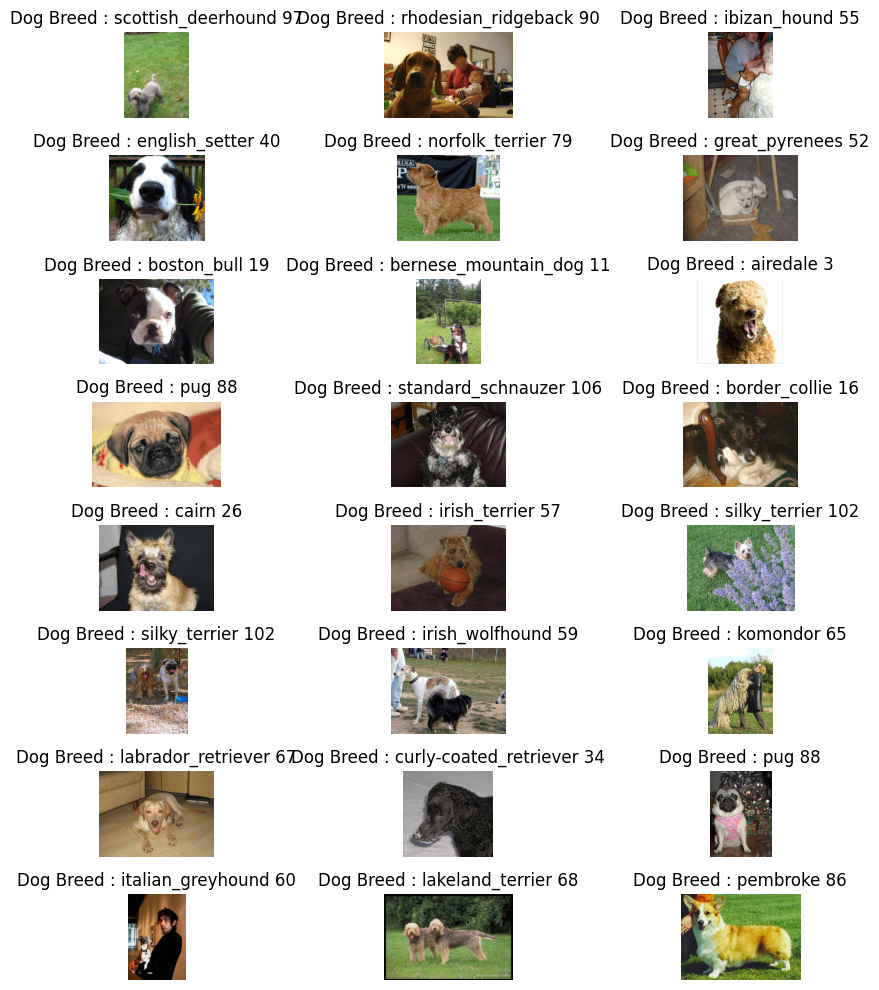

In [92]:
# Calculate the number of rows and columns dynamically
num_images = len(test_filename)
num_cols = 3  # Number of columns to display
# num_rows = (num_images + num_cols - 1) // num_cols  # Calculate number of rows
num_rows = 8
# Display the predicted labels along with their respective images
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 10))

# for i in range(num_images):
for i in range(24):
    img = plt.imread(test_filename[i])
    row = i // num_cols
    col = i % num_cols
    axes[row, col].imshow(img)
    axes[row, col].set_title(f"Dog Breed : {test_pred_labels[i]} {np.argmax(test_pred[i])}")
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()
